# Observando filtro de Canny, e retas encontradas com transformada de Hough

## Importando bibliotecas

In [1]:
import numpy as np
import seaborn as sns

from zipfile import ZipFile
from matplotlib import pyplot as plt
from scipy.stats import mode
from skimage.io import imread
from skimage.feature import canny
from skimage.filters import threshold_otsu
from skimage.transform import hough_line, hough_line_peaks

sns.set_style(style='ticks')
plt.gray()

CANNY_SIGMA = 3

LIMITE_DE_NORMALIZACAO = 8

COLOR_NAMES = ['vermelho', 'verde', 'azul']
COLOR_CODES = ['r-', 'g-', 'b-', 'brown-', 'orange-']

In [2]:
path_list = []
with ZipFile('./toras.zip') as zip_file:
  for path in zip_file.namelist():
    if '__MAC' not in path \
        and '.JPG' in path:
      path_list.append(f'./toras.zip/{path}')

<Figure size 640x480 with 0 Axes>

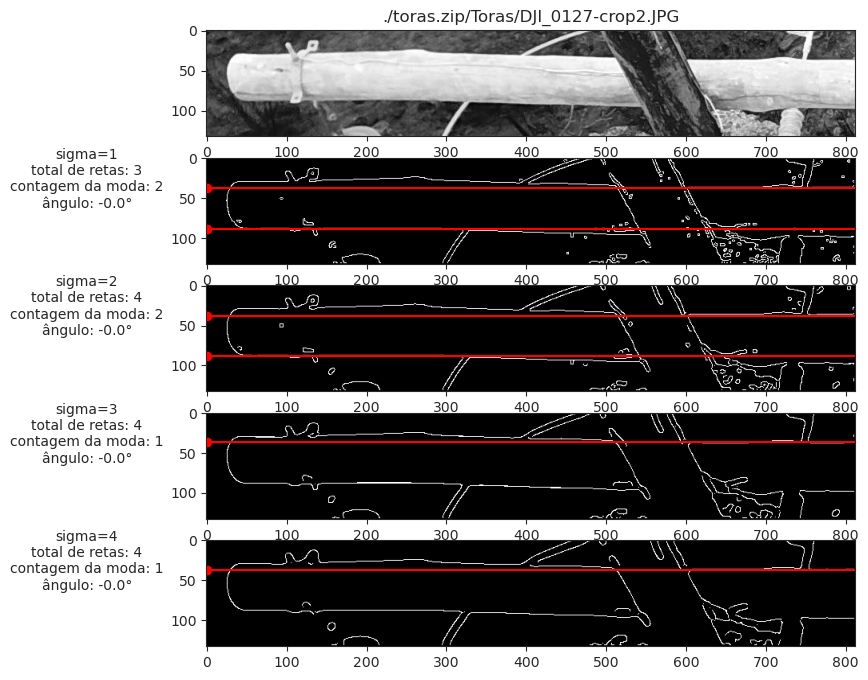

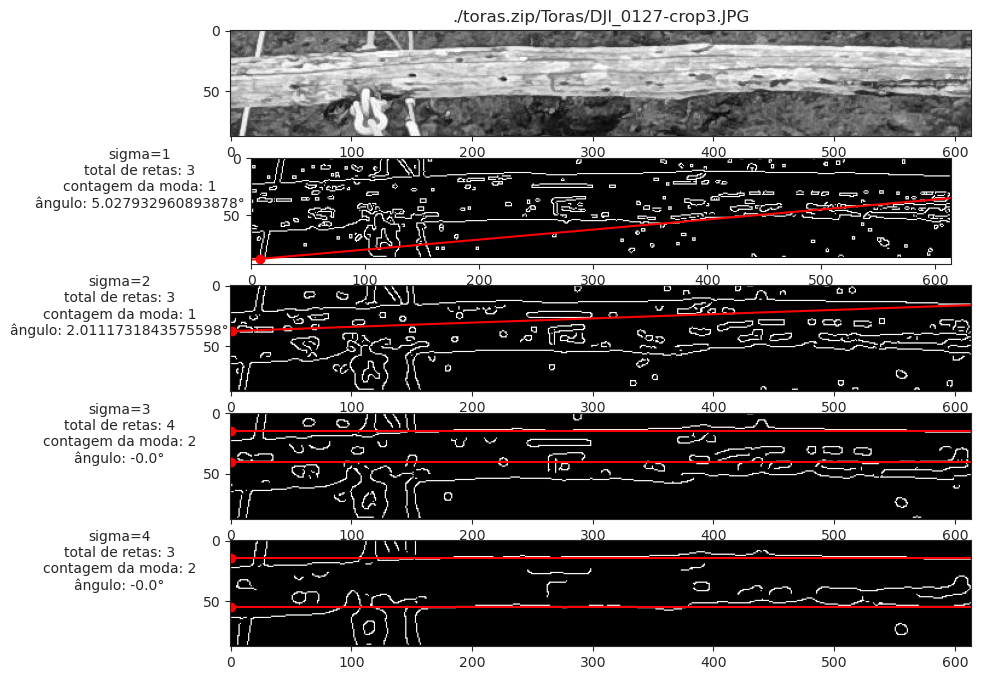

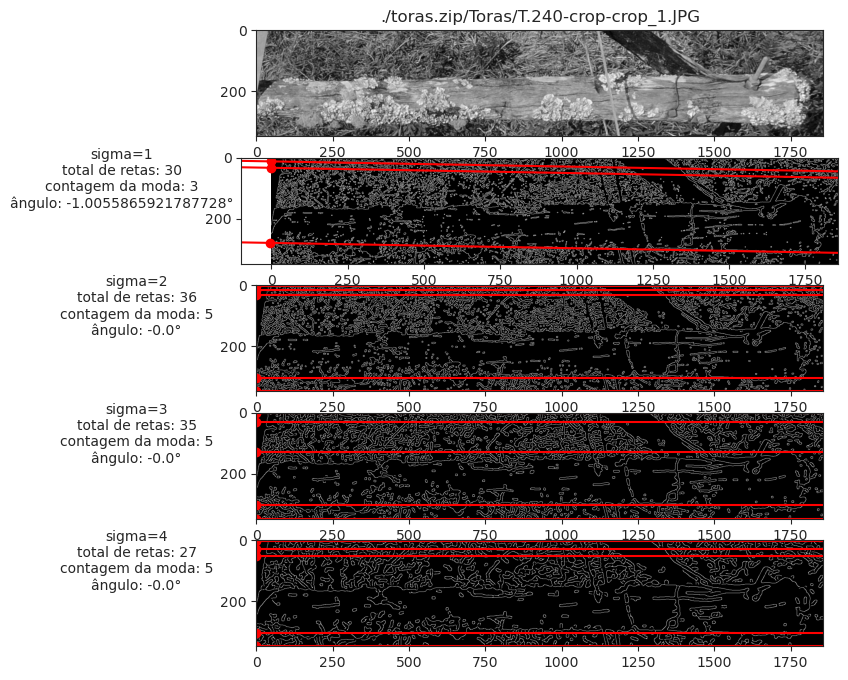

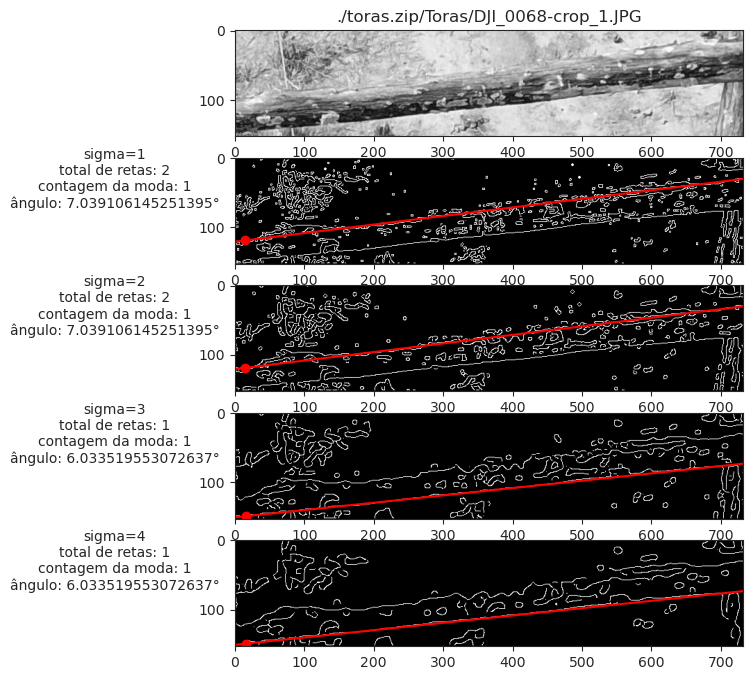

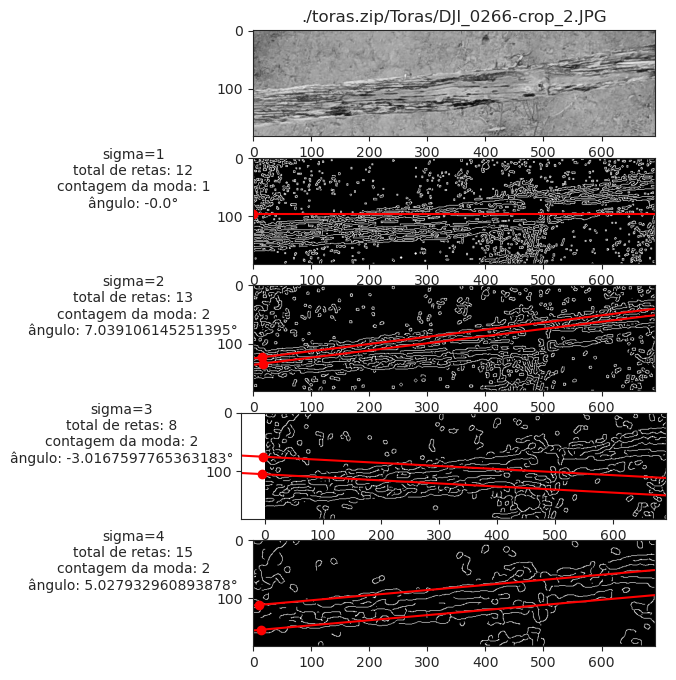

...

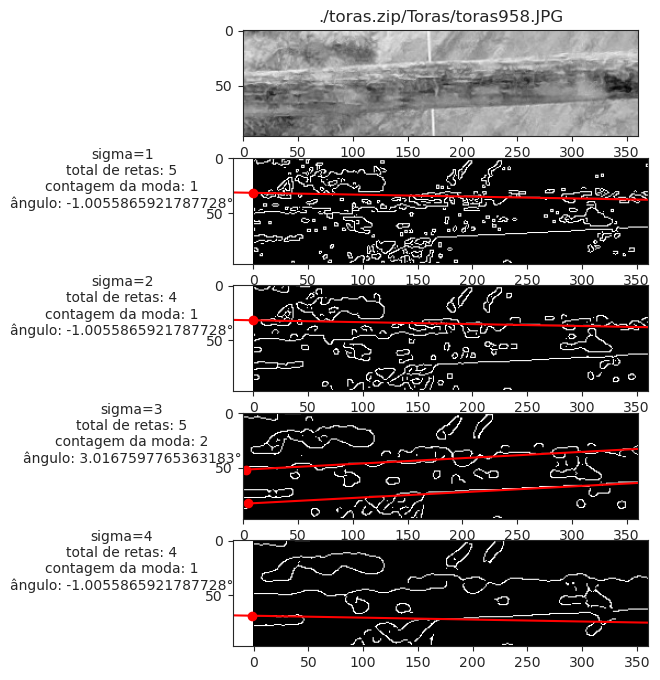

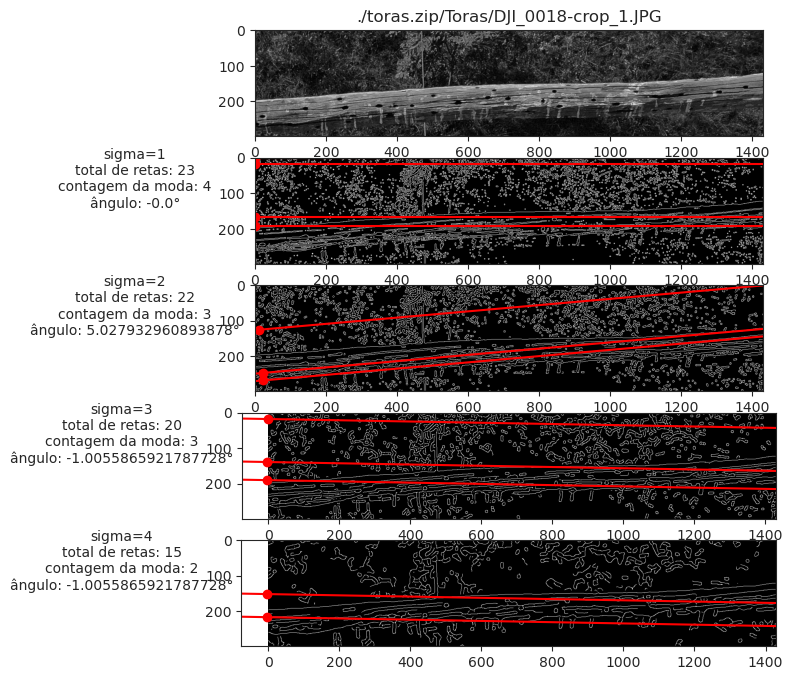

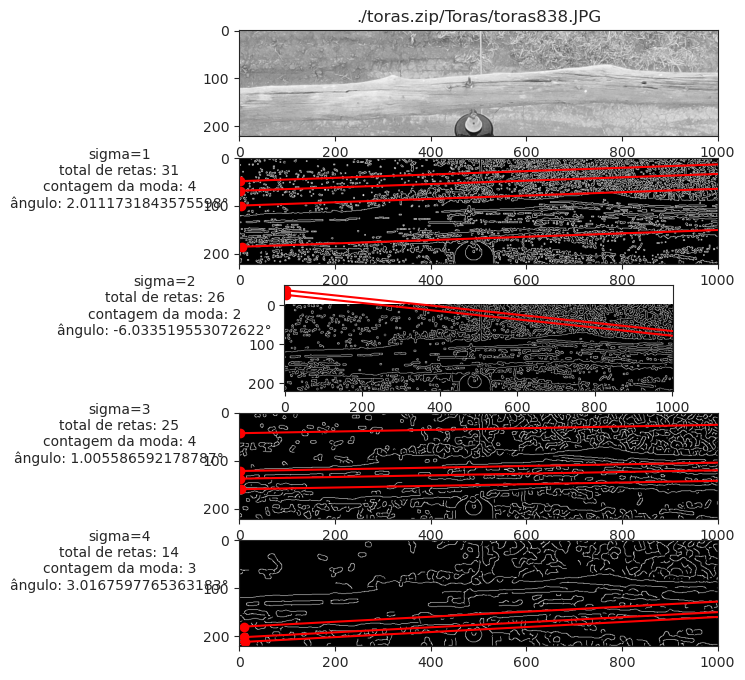

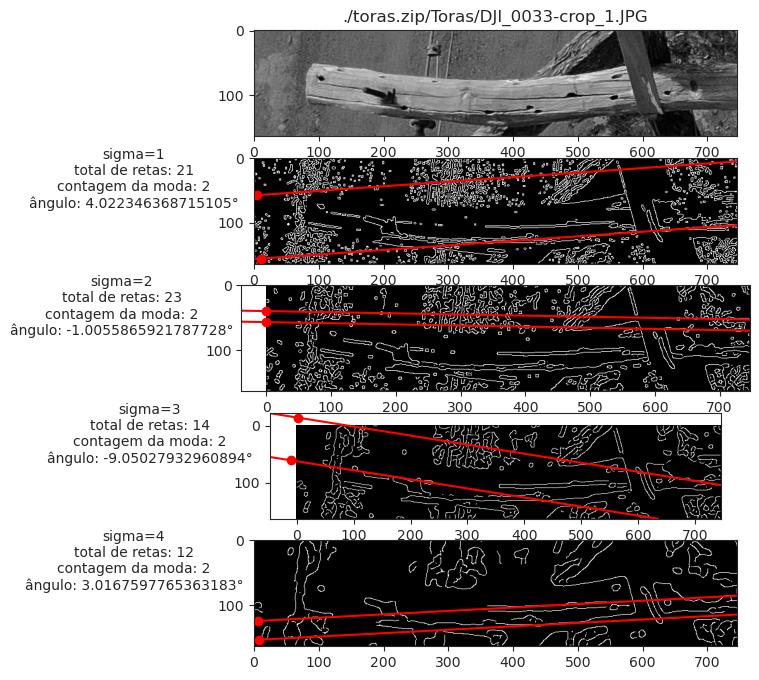

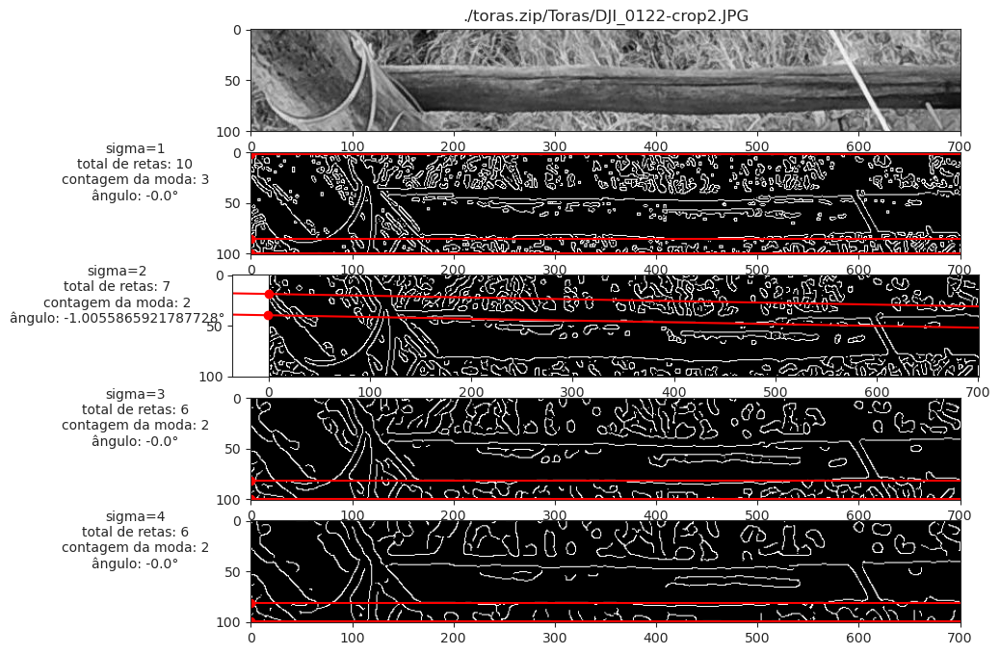

In [3]:
for path in path_list:
  # lendo imagem grayscale
  img_gray = imread(path, as_gray=True)

  # encontrando bordas
  img_otsu = img_gray >= threshold_otsu(img_gray)
  # Plotando imagens
  fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(15, 8))

  # Plotando imagem original
  ax[0].title.set_text(f'{path}')
  ax[0].imshow(img_gray)

  for img_count, canny_sigma in enumerate(range(1, 5), start=1):
    edges = canny(img_otsu, sigma=canny_sigma)

    h, theta, d = hough_line(edges)
    accum, angles, dists = hough_line_peaks(h, theta, d)

    moda = mode(angles, axis=None)
    angle = moda.mode[0]
    angle_deg = -(np.rad2deg(angle) + (90 if angle < 0 else - 90))
    count = moda.count[0]
    total = len(angles)

    # Exibindo bordas do canny
    ax[img_count].imshow(edges)
    ax[img_count].set_ylabel(f'sigma={canny_sigma}\n'
                            +f'total de retas: {total}\n'
                            +f'contagem da moda: {count}\n'
                            +f'ângulo: {angle_deg}°',
                            rotation=0, labelpad=60)

    # desenhando retas
    for _, angulo, distancia in zip(accum, angles, dists):
      if angle == angulo:
        (x0, y0) = distancia * np.array([np.cos(angulo), np.sin(angulo)])
        ax[img_count].axline((x0, y0), slope=np.tan(angulo + np.pi/2), color='r')
        ax[img_count].plot(x0, y0, 'ro') # ponto da reta
  plt.show()
